In [1]:
# This is the simplified python script that demonstrates how to directly run slide-seq v1 dataset with BANKSY
import os, time, random, gc
import anndata
from anndata import AnnData
import numpy as np
import pandas as pd
import warnings
from banksy_utils.color_lists import spagcn_color
warnings.filterwarnings("ignore")
import scanpy as sc
sc.logging.print_header()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 1  # errors (0), warnings (1), info (2), hints (3)

seed = 0
np.random.seed(seed)
random.seed(seed)
start = time.perf_counter_ns()

scanpy==1.9.5 anndata==0.10.2 umap==0.5.4 numpy==1.24.4 scipy==1.11.3 pandas==2.1.1 scikit-learn==1.3.1 statsmodels==0.14.0 igraph==0.10.6 pynndescent==0.5.10


### Analysis for CODEX
- Dataset is publically available here [CODEX dataset](https://datadryad.org/stash/dataset/doi:10.5061/dryad.pk0p2ngrf). 
- Download the file `GSM7423_09_CODEX_HuBMAP_alldata_Dryad_merged.csv` (a healthy colon HC sample).
- Arrange it under `data/CODEX/23_09_CODEX_HuBMAP_alldata_Dryad_merged`

In [2]:
file_path = os.path.join("data", "CODEX","CODEX_csv_data")
metadata_file = "23_09_CODEX_HuBMAP_alldata_Dryad_merged.csv"
meta_df = pd.read_csv(os.path.join(file_path, metadata_file), index_col=0)

### `CODEX` dataset Analysis 
This dataset contains samples from all donors. Here, we focus on identifying tissue segments from the transverse segment for donor B008. This can be accessed via `meta_df['unique_region'] == B006_Ascending`

In [3]:
# See all unique regions availale for clustering
meta_df['unique_region'].unique()

array(['B004_Ascending', 'B005_Ascending', 'B006_Ascending', 'B009_Right',
       'B010_Right', 'B011_Right', 'B012_Right', 'B008_Right',
       'B004_Descending', 'B005_Descending', 'B006_Descending',
       'B009_Left', 'B012_Left', 'B011_Left', 'B010_Left', 'B008_Left',
       'B005_Duodenum', 'B004_Duodenum', 'B006_Duodenum', 'B009_Duodenum',
       'B011_Duodenum', 'B012_Duodenum', 'B010_Duodenum', 'B008_Duodenum',
       'B004_Ileum', 'B005_Ileum', 'B006_Ileum', 'B009_Ileum',
       'B010_Ileum', 'B011_Ileum', 'B012_Ileum', 'B008_Ileum',
       'B006_Mid-jejunum', 'B004_Mid-jejunum', 'B005_Mid-jejunum',
       'B009_Mid jejunum', 'B009_Mid jejunum_extra', 'B011_Mid jejunum',
       'B012_Mid jejunum', 'B010_Mid jejunum', 'B008_Mid jejunum',
       'B004_Proximal Jejunum', 'B005_Proximal Jejunum',
       'B006_Proximal Jejunum', 'B011_Proximal jejunum',
       'B009_Proximal jejunum', 'B010_Proximal jejunum',
       'B012_Proximal jejunum', 'B008_Proximal jejunum',
       'B008_Pr

#### Access `ascending` region for patient B006

In [4]:
unique_regions = ["B006_Ascending"]
meta_df = meta_df.loc[meta_df['unique_region'].isin(unique_regions)]
meta_df

,MUC2,SOX9,MUC1,CD31,Synapto,CD49f,CD15,CHGA,CDX2,ITLN1,...,Cell Type em,Cell subtype,Neighborhood,Neigh_sub,Neighborhood_Ind,NeighInd_sub,Community,Major Community,Tissue Segment,Tissue Unit
16,-0.304614,-0.710798,-0.468051,-0.319693,0.171805,-0.559432,-0.453212,1.094747,-0.326250,-0.440183,...,NK,Immune,Transit Amplifying Zone,Epithelial,Mature Epithelial,Epithelial,Secretory Epithelial,Epithelial,Mucosa,Mucosa
17,-0.304614,-0.710798,-0.453068,-0.324566,-0.237084,0.456636,1.207743,1.631276,-0.329250,-0.244448,...,NK,Immune,Secretory Epithelial,Epithelial,Neuroendocrine Enriched,Epithelial,Secretory Epithelial,Epithelial,Mucosa,Mucosa
18,-0.304614,-0.653688,-0.466441,-0.324566,-0.252402,-0.456011,-0.362147,-0.088997,-0.293637,-0.397629,...,NK,Immune,Innate Immune Enriched,Immune,Neuroendocrine Enriched,Epithelial,Adaptive Immune Enriched,Immune,Mucosa,Mucosa
19,-0.304614,-0.710798,-0.483487,-0.302272,-0.064282,-0.559432,-0.463499,1.290170,0.577592,-0.597531,...,NK,Immune,CD66+ Mature Epithelial,Epithelial,Secretory Epithelial,Epithelial,CD66+ Mature Epithelial,Epithelial,Mucosa,Mucosa
20,-0.304614,-0.621819,-0.442973,-0.182307,2.436546,-0.520991,-0.119378,0.060966,-0.163253,-0.256184,...,NK,Immune,Plasma Cell Enriched,Immune,Plasma Cell Enriched,Immune,Plasma Cell Enriched,Immune,Mucosa,Mucosa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76910,-0.236842,-0.449233,-0.472751,-0.321514,-0.281810,-0.508375,-0.463499,-0.123212,-0.174804,-0.595790,...,Stroma,Stromal,Smooth Muscle,Stromal,Smooth Muscle,Stromal,Smooth Muscle,Smooth Muscle,Muscle,Muscularis externa
76911,-0.304614,-0.663349,-0.477497,-0.322441,-0.281710,-0.550296,-0.463489,-0.042228,-0.292808,-0.591222,...,Stroma,Stromal,Stroma & Innate Immune,Stromal,Stroma & Innate Immune,Stromal,Stroma,Stroma,Subucosa,Submucosa
76912,-0.304614,-0.705193,-0.483259,-0.316495,-0.282309,-0.542610,-0.462937,-0.224805,-0.289586,-0.582396,...,Stroma,Stromal,Stroma,Stromal,Stroma,Stromal,Smooth Muscle,Smooth Muscle,Muscle,Muscularis externa
76913,-0.304614,-0.710798,-0.343960,-0.324566,-0.273847,-0.524648,-0.460974,-0.210378,-0.288112,-0.556884,...,Stroma,Stromal,Innervated Stroma,Stromal,Innervated Stroma,Stromal,Innate Immune Enriched,Immune,Mucosa,Mucosa


### Create AnnData object
The dataset can be split into the `cell-expression matrix` (indexed from columns 1 to 47) and rest of the metadata (indexed from columns 47 onwards) this also including the position of cells under `XCorr` and `YCorr`.

In [5]:
adata = AnnData(X = np.array(meta_df.iloc[:, :47]), obs = meta_df.iloc[:, 47:])
adata.var_names_make_unique()
# Just to save RAM
del meta_df
gc.collect()

23522

### Having a feel for the `adata` object
Add the position array under `adata.obsm['coord_xy']`

In [6]:
# Stack coordinate array
coord_keys = ('Xcorr', 'Ycorr', 'coord_xy')
adata.obsm[coord_keys[2]] = np.vstack((adata.obs[coord_keys[0]].values,adata.obs[coord_keys[1]].values)).T

# See the adata.obs for this sample
adata.obs

,x,y,array,Xcorr,Ycorr,Tissue_location,tissue,donor,unique_region,region,...,Cell Type em,Cell subtype,Neighborhood,Neigh_sub,Neighborhood_Ind,NeighInd_sub,Community,Major Community,Tissue Segment,Tissue Unit
16,1781.0,8187.0,B006_CL,11189.0,17259.0,Ascending,CL,B006,B006_Ascending,4.0,...,NK,Immune,Transit Amplifying Zone,Epithelial,Mature Epithelial,Epithelial,Secretory Epithelial,Epithelial,Mucosa,Mucosa
17,2757.0,6692.0,B006_CL,12165.0,15764.0,Ascending,CL,B006,B006_Ascending,4.0,...,NK,Immune,Secretory Epithelial,Epithelial,Neuroendocrine Enriched,Epithelial,Secretory Epithelial,Epithelial,Mucosa,Mucosa
18,5080.0,5034.0,B006_CL,14488.0,14106.0,Ascending,CL,B006,B006_Ascending,4.0,...,NK,Immune,Innate Immune Enriched,Immune,Neuroendocrine Enriched,Epithelial,Adaptive Immune Enriched,Immune,Mucosa,Mucosa
19,63.0,8098.0,B006_CL,9471.0,17170.0,Ascending,CL,B006,B006_Ascending,4.0,...,NK,Immune,CD66+ Mature Epithelial,Epithelial,Secretory Epithelial,Epithelial,CD66+ Mature Epithelial,Epithelial,Mucosa,Mucosa
20,571.0,8200.0,B006_CL,9979.0,17272.0,Ascending,CL,B006,B006_Ascending,4.0,...,NK,Immune,Plasma Cell Enriched,Immune,Plasma Cell Enriched,Immune,Plasma Cell Enriched,Immune,Mucosa,Mucosa
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76910,1004.0,2791.0,B006_CL,10412.0,11863.0,Ascending,CL,B006,B006_Ascending,4.0,...,Stroma,Stromal,Smooth Muscle,Stromal,Smooth Muscle,Stromal,Smooth Muscle,Smooth Muscle,Muscle,Muscularis externa
76911,8949.0,3367.0,B006_CL,18357.0,12439.0,Ascending,CL,B006,B006_Ascending,4.0,...,Stroma,Stromal,Stroma & Innate Immune,Stromal,Stroma & Innate Immune,Stromal,Stroma,Stroma,Subucosa,Submucosa
76912,1270.0,3952.0,B006_CL,10678.0,13024.0,Ascending,CL,B006,B006_Ascending,4.0,...,Stroma,Stromal,Stroma,Stromal,Stroma,Stromal,Smooth Muscle,Smooth Muscle,Muscle,Muscularis externa
76913,8201.0,6024.0,B006_CL,17609.0,15096.0,Ascending,CL,B006,B006_Ascending,4.0,...,Stroma,Stromal,Innervated Stroma,Stromal,Innervated Stroma,Stromal,Innate Immune Enriched,Immune,Mucosa,Mucosa


In [7]:
adata

AnnData object with n_obs × n_vars = 38371 × 47
    obs: 'x', 'y', 'array', 'Xcorr', 'Ycorr', 'Tissue_location', 'tissue', 'donor', 'unique_region', 'region', 'OLFM4', 'FAP', 'CD25', 'CollIV', 'CK7', 'MUC6', 'Cell Type', 'Cell Type em', 'Cell subtype', 'Neighborhood', 'Neigh_sub', 'Neighborhood_Ind', 'NeighInd_sub', 'Community', 'Major Community', 'Tissue Segment', 'Tissue Unit'
    obsm: 'coord_xy'

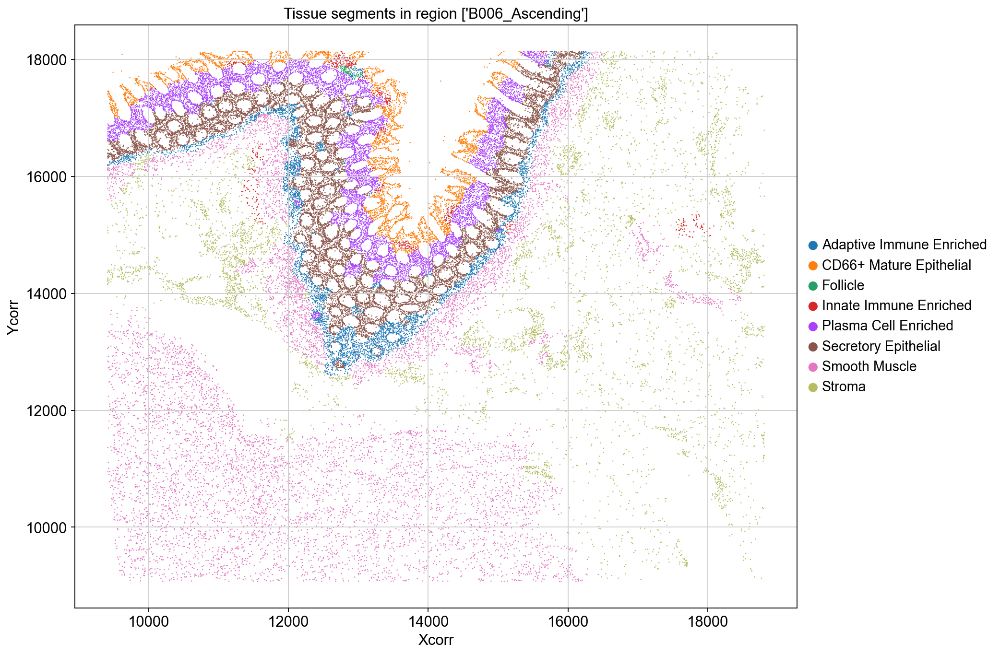

In [8]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (10,10)
cmap = plt.get_cmap('tab20')
sc.pl.scatter(adata, x='Xcorr', y='Ycorr', color='Community',  color_map=cmap, title=f"Tissue segments in region {unique_regions}", size = 5)#show = False, size = 5)
plt.show()

## Running BANKSY
As a demonstration to identify the communities, we run BANKSY using the following (default) parameters for `domain segmentation`:
- $k_{geom} = 15 $
-  $\lambda = 0.8$
- m = 1 (first order azimuthal transform)
</br>

From, the BANKSY embeddings, we then
- Run PCA with 20 PCs
- Perform Leiden clustering with a resolution parameter of 2.0
<br>

In [9]:
from banksy.main import median_dist_to_nearest_neighbour
from banksy.initialize_banksy import initialize_banksy
from banksy.embed_banksy import generate_banksy_matrix
from banksy.main import concatenate_all

k_geom = 15  # only for fixed type
max_m = 1  # azumithal transform up to kth order
nbr_weight_decay = "scaled_gaussian"  # can also be "reciprocal", "uniform" or "ranked"
resolutions = None  # clustering resolution for leiden algorithm
max_labels = 8 # Number of clusters for tissue segmentation
pca_dims = [20]  # Dimensionality in which PCA reduces to
lambda_list = [0.8]

### Initalize the weighted neighbourhood graphs for BANKSY 


Median distance to closest cell = 17.0

---- Ran median_dist_to_nearest_neighbour in 0.23 s ----


Median distance to closest cell = 17.0

---- Ran median_dist_to_nearest_neighbour in 0.24 s ----

---- Ran generate_spatial_distance_graph in 0.44 s ----

---- Ran row_normalize in 0.20 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 1.92 s ----

---- Ran generate_spatial_distance_graph in 0.67 s ----

---- Ran theta_from_spatial_graph in 0.42 s ----

---- Ran row_normalize in 0.17 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 2.57 s ----

----- Plotting Weights Graph -----
Maximum weight: 0.20920011218474813

---- Ran plot_graph_weights in 7.62 s ----

Maximum weight: (0.0964758187272066-0.022970432326578534j)

---- Ran plot_graph_weights in 15.93 s ----



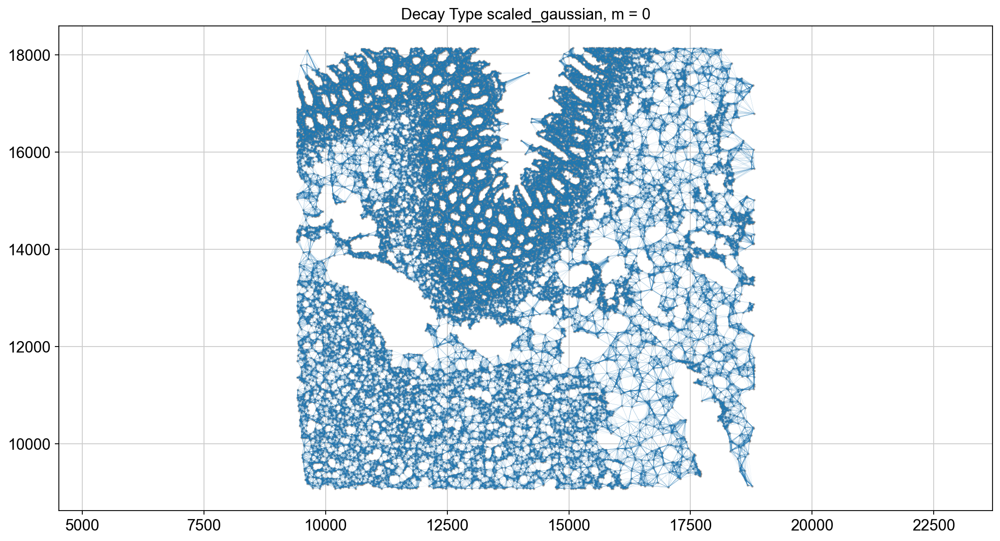

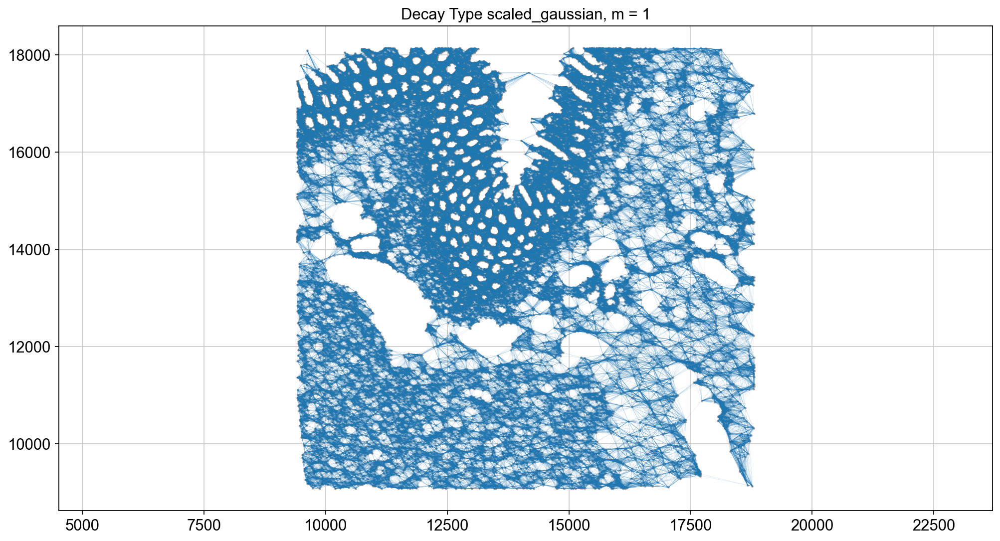

In [10]:
nbrs = median_dist_to_nearest_neighbour(adata, key=coord_keys[2])
banksy_dict = initialize_banksy(adata,
                                coord_keys,
                                k_geom,
                                nbr_weight_decay=nbr_weight_decay,
                                max_m=max_m,
                                plt_edge_hist=False,
                                plt_nbr_weights=True,
                                plt_agf_angles=False,
                                plt_theta=False
                                )


## Create BANKSY Matrix

In [11]:
banksy_dict, banksy_matrix = generate_banksy_matrix(adata,
                                                    banksy_dict,
                                                    lambda_list,
                                                    max_m)

# Create output folder path if not done so
output_folder = os.path.join(file_path, 'BANKSY-Results')
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

Runtime Oct-24-2024-15-50

47 genes to be analysed:
Gene List:
Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36',
       '37', '38', '39', '40', '41', '42', '43', '44', '45', '46'],
      dtype='object')

Decay Type: scaled_gaussian
Weights Object: {'weights': {0: <38371x38371 sparse matrix of type '<class 'numpy.float64'>'
	with 575565 stored elements in Compressed Sparse Row format>, 1: <38371x38371 sparse matrix of type '<class 'numpy.complex128'>'
	with 1151130 stored elements in Compressed Sparse Row format>}}

Nbr matrix | Mean: -0.08 | Std: 0.37
Size of Nbr | Shape: (38371, 47)
Top 3 entries of Nbr Mat:

[[-0.29774731  0.46332717  0.62082927]
 [-0.19948814  0.28153067  0.22979904]
 [-0.29145193 -0.41874117 -0.23812009]]

AGF matrix | Mean: 0.12 | Std: 0.15
Size of AGF mat (m = 1) | Shape: (38371, 47)

### Perform Dimensionality Reduction
1. Perform PCA to produce PCA embeddings for Leiden Clustering
2. UMAP (just for visualization)

Current decay types: ['scaled_gaussian']

Reducing dims of dataset in (Index = scaled_gaussian, lambda = 0.8)

Setting the total number of PC = 20
Original shape of matrix: (38371, 141)
Reduced shape of matrix: (38371, 20)
------------------------------------------------------------
min_value = -11.803936780880614, mean = 1.16735592145935e-16, max = 56.77232310756606

Conducting UMAP and adding embeddings to adata.obsm["reduced_pc_20_umap"]
UMAP embedding
------------------------------------------------------------
shape: (38371, 2)


AxisArrays with keys: reduced_pc_20, reduced_pc_20_umap


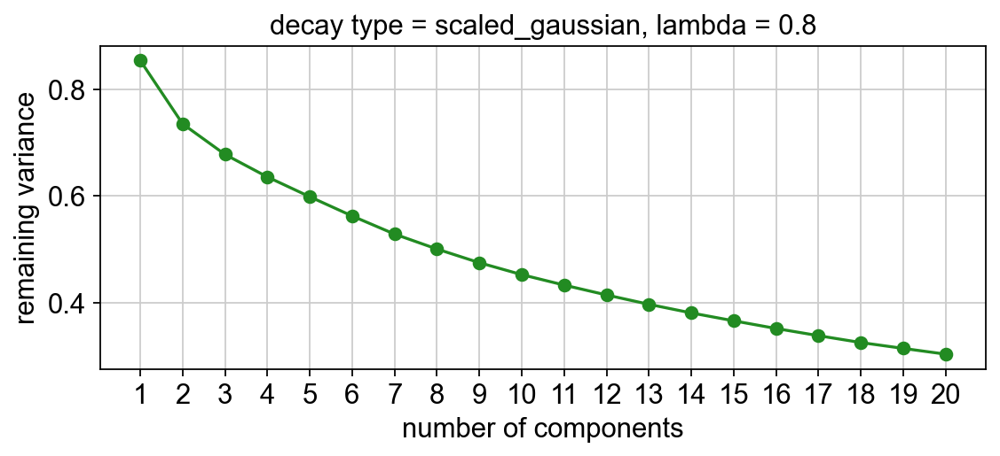

In [12]:
from banksy_utils.umap_pca import pca_umap

pca_umap(banksy_dict,
         pca_dims = pca_dims,
         add_umap = True
         )

## Run Leiden Parition and plot the results

Decay type: scaled_gaussian
Neighbourhood Contribution (Lambda Parameter): 0.8
reduced_pc_20 

reduced_pc_20_umap 

PCA dims to analyse: [20]

Setting up partitioner for (nbr decay = scaled_gaussian), Neighbourhood contribution = 0.8, PCA dimensions = 20)


Nearest-neighbour weighted graph (dtype: float64, shape: (38371, 38371)) has 1918550 nonzero entries.
---- Ran find_nn in 66.79 s ----


Nearest-neighbour connectivity graph (dtype: int16, shape: (38371, 38371)) has 1918550 nonzero entries.

(after computing shared NN)
Allowing nearest neighbours only reduced the number of shared NN from 29631103 to 1916073.


Shared nearest-neighbour (connections only) graph (dtype: int16, shape: (38371, 38371)) has 1831226 nonzero entries.

Shared nearest-neighbour (number of shared neighbours as weights) graph (dtype: int16, shape: (38371, 38371)) has 1831226 nonzero entries.

sNN graph data:
[7 8 9 ... 8 9 6]

---- Ran shared_nn in 2.33 s ----


-- Multiplying sNN connectivity by weights --


sh

,decay,lambda_param,num_pcs,resolution,num_labels,labels,adata,relabeled
scaled_gaussian_pc20_nc0.80_r0.55,scaled_gaussian,0.8,20,0.55,8,"Label object:\nNumber of labels: 8, number of ...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 8, number of ..."


number of labels: 8
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 8
---- Ran plot_2d_embeddings in 0.01 s ----

number of labels: 8
---- Ran plot_2d_embeddings in 0.01 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((8, 38371) x (38371, 38371) x (38371, 8))

Saving full-figure at data\CODEX\CODEX_csv_data\BANKSY-Results\CODEX-['B006_Ascending']_scaled_gaussian_pc20_nc0.80_r0.55_full_figure.png


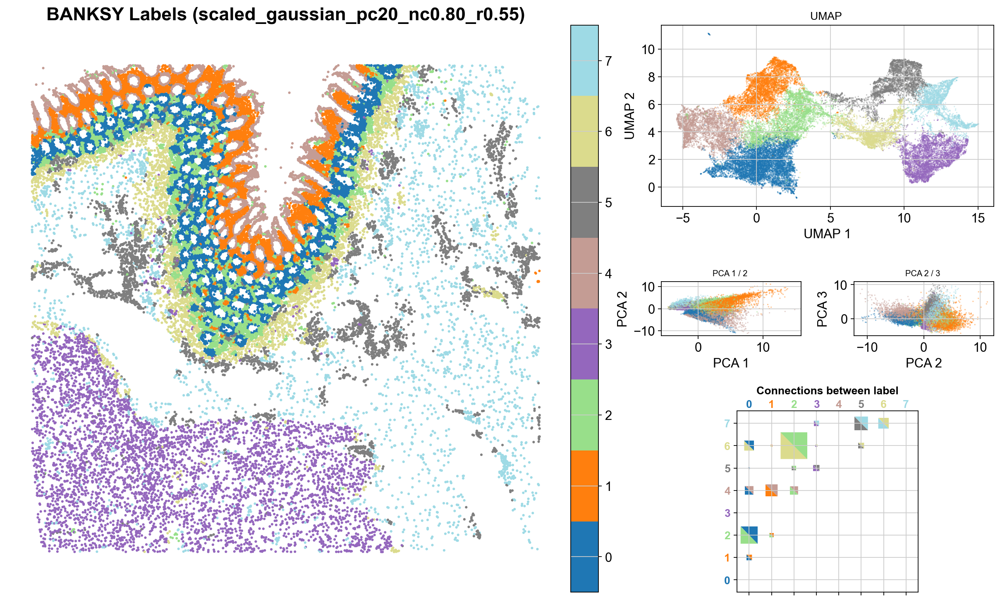

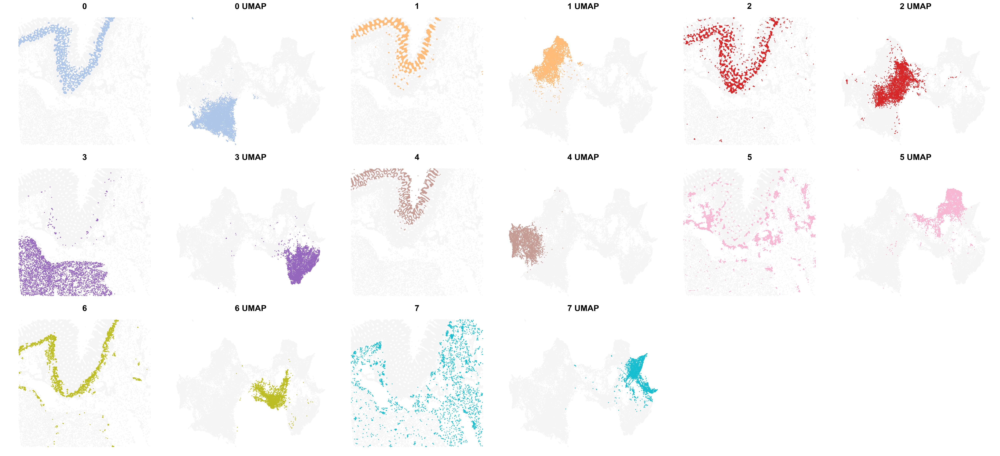

In [13]:
from banksy.cluster_methods import run_Leiden_partition

banksy_df, max_num_labels = run_Leiden_partition(
    banksy_dict,
    resolutions,
    num_nn = 50,
    num_iterations = -1,
    partition_seed = 1234,
    match_labels = True,
    max_labels = max_labels,
)

from banksy.plot_banksy import plot_results

c_map =  'tab20' # specify color map
weights_graph =  banksy_dict['scaled_gaussian']['weights'][1]

plot_results(
    banksy_df,
    weights_graph,
    c_map,
    match_labels = True,
    coord_keys = coord_keys,
    max_num_labels  =  max_num_labels, 
    save_path = os.path.join(file_path, 'BANKSY-Results'),
    save_fig = False, # Save Spatial Plot Only
    save_fullfig = True, # Save Full Plot
    dataset_name = f"CODEX-{unique_regions}",
    save_labels=True
)
banksy_df.to_csv(os.path.join(file_path, f"CODEX-{unique_regions}_BANKSY.csv"))

## Perform nonspatial clustering (for comparsion)

Scale factors squared: [1.]
Scale factors: [1.]
Current decay types: ['nonspatial']

Reducing dims of dataset in (Index = nonspatial, lambda = 0.0)

Setting the total number of PC = 20
Original shape of matrix: (38371, 47)
Reduced shape of matrix: (38371, 20)
------------------------------------------------------------
min_value = -19.10000953885526, mean = -4.740531660748629e-18, max = 103.56893592138277

Conducting UMAP and adding embeddings to adata.obsm["reduced_pc_20_umap"]
UMAP embedding
------------------------------------------------------------
shape: (38371, 2)


AxisArrays with keys: reduced_pc_20, reduced_pc_20_umap
Decay type: nonspatial
Neighbourhood Contribution (Lambda Parameter): 0.0
reduced_pc_20 

reduced_pc_20_umap 

PCA dims to analyse: [20]

Setting up partitioner for (nbr decay = nonspatial), Neighbourhood contribution = 0.0, PCA dimensions = 20)


Nearest-neighbour weighted graph (dtype: float64, shape: (38371, 38371)) has 1918550 nonzero entries.
---- Ran find_

,decay,lambda_param,num_pcs,resolution,num_labels,labels,adata,relabeled
nonspatial_pc20_nc0.00_r0.20,nonspatial,0.0,20,0.2,7,"Label object:\nNumber of labels: 7, number of ...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 7, number of ..."


number of labels: 7
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 7
---- Ran plot_2d_embeddings in 0.01 s ----

number of labels: 7
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((7, 38371) x (38371, 38371) x (38371, 7))

Saving full-figure at data\CODEX\CODEX_csv_data\BANKSY-Results\CODEX-['B006_Ascending']_nonspatial_pc20_nc0.00_r0.20_full_figure.png


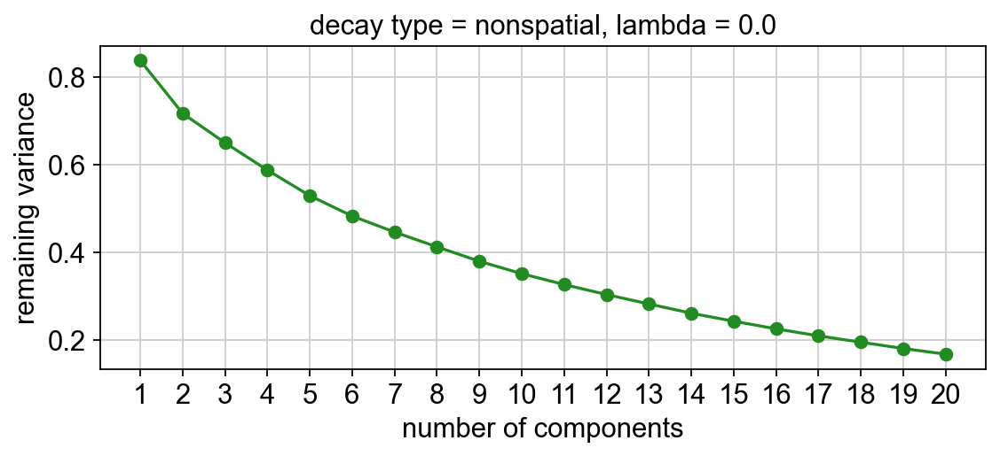

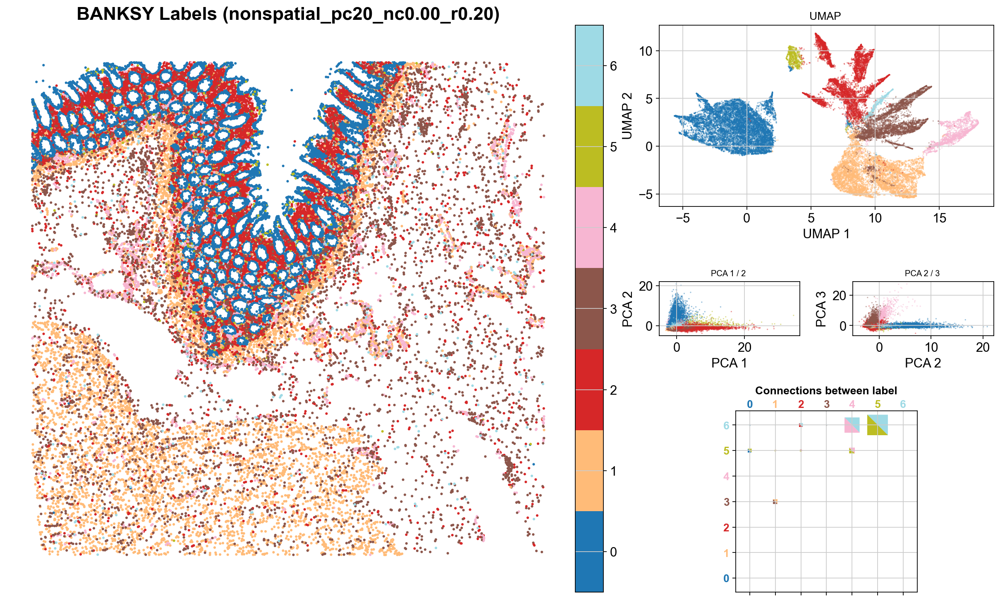

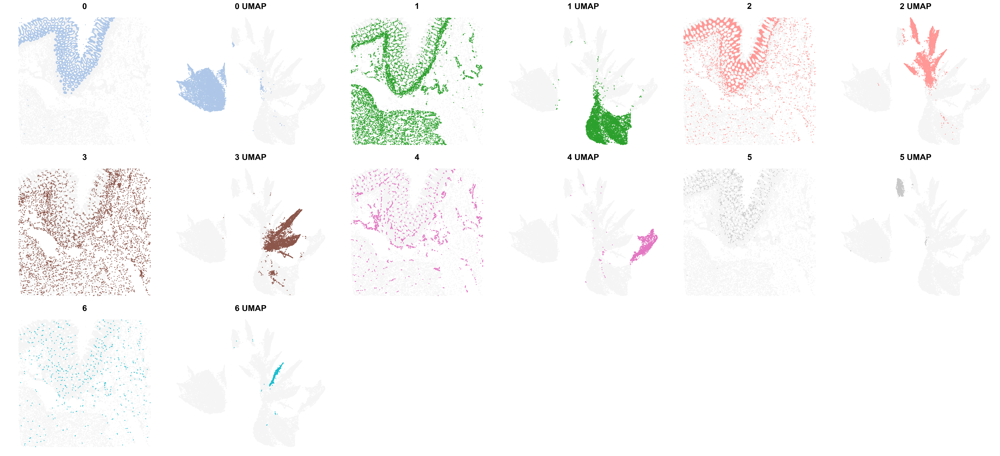

In [14]:
# Add nonspatial clustering
nonspatial_dict = {"nonspatial" : {0.0: {"adata": concatenate_all([adata.X], 0, adata=adata), } } }

pca_umap(nonspatial_dict, pca_dims = pca_dims, add_umap = True )

from banksy.cluster_methods import run_Leiden_partition

nonspatial_df, max_num_labels = run_Leiden_partition(
    nonspatial_dict,
    resolutions,
    num_nn = 50,
    num_iterations = -1,
    partition_seed = 1234,
    match_labels = True,
    max_labels = max_labels,
)

from banksy.plot_banksy import plot_results

c_map =  'tab20' # specify color map

plot_results(
    nonspatial_df,
    weights_graph,
    c_map,
    match_labels = True,
    coord_keys = coord_keys,
    max_num_labels  =  max_num_labels, 
    save_path = os.path.join(file_path, 'BANKSY-Results'),
    save_fig = False, # Save Spatial Plot Only
    save_fullfig = True, # Save Full Plot
    dataset_name = f"CODEX-{unique_regions}",
    save_labels=True
)

## Compare similarity between BANKSY clusters and CODEX communities

In [15]:
from sklearn.metrics import adjusted_rand_score as ari, adjusted_mutual_info_score as ami
from sklearn.metrics import matthews_corrcoef as mcc
# See the visualize the communities that we want to detect
adata.obs['Community']

16           Secretory Epithelial
17           Secretory Epithelial
18       Adaptive Immune Enriched
19        CD66+ Mature Epithelial
20           Plasma Cell Enriched
                   ...           
76910               Smooth Muscle
76911                      Stroma
76912               Smooth Muscle
76913      Innate Immune Enriched
76914                      Stroma
Name: Community, Length: 38371, dtype: category
Categories (8, object): ['Adaptive Immune Enriched', 'CD66+ Mature Epithelial', 'Follicle', 'Innate Immune Enriched', 'Plasma Cell Enriched', 'Secretory Epithelial', 'Smooth Muscle', 'Stroma']

### Access clustering results from BANKSY in domain segmentation mode using `banksy_df.labels[{label_index}]`

In [16]:
# We can access the clusters from banksy using the following command
banksy_spatial_clusters = banksy_df.labels[banksy_df.index[0]]
banksy_spatial_clusters.dense

array([0, 0, 0, ..., 7, 7, 5])

### Access clustering results from nonspatial clustering in a similar way

In [17]:
# We can access the clusters from banksy using the following command
nonspatial_clusters = nonspatial_df.labels[nonspatial_df.index[0]]
nonspatial_clusters.dense

array([1, 0, 0, ..., 6, 3, 3])

### Compare the similarity between clusters from BANKSY vs nonspatial clusters and the annotated communities

In [18]:
def calculate_metrics(cluster_labels, annotated_labels):
    # A custom function to calcualte all metrics
    ari_score  = ari(cluster_labels, annotated_labels)
    ami_score =   ami(cluster_labels, annotated_labels)

    if isinstance(annotated_labels.dtype, pd.CategoricalDtype):
        print("Converting annotations to required 'int' type for computing MCC")
        annotated_labels = annotated_labels.cat.codes

    mcc_score =  mcc(cluster_labels,annotated_labels )
    return ari_score, ami_score, mcc_score

nonspatial_ari, nonspatial_ami, nonspatial_mcc = calculate_metrics(nonspatial_clusters.dense, adata.obs['Community'])

Converting annotations to required 'int' type for computing MCC


### Calculate the similarity between BANKSY labels and annotated communities

In [19]:
banksy_ari, banksy_ami, banksy_mcc = calculate_metrics(banksy_spatial_clusters.dense, adata.obs['Community'])

Converting annotations to required 'int' type for computing MCC


### Plot bar chart comparing their similarities

(0.23827379419113168, 0.41088841719504765)
(0.25031671239390263, 0.5131559131775246)
(-0.027569143824956628, 0.13192214499904387)


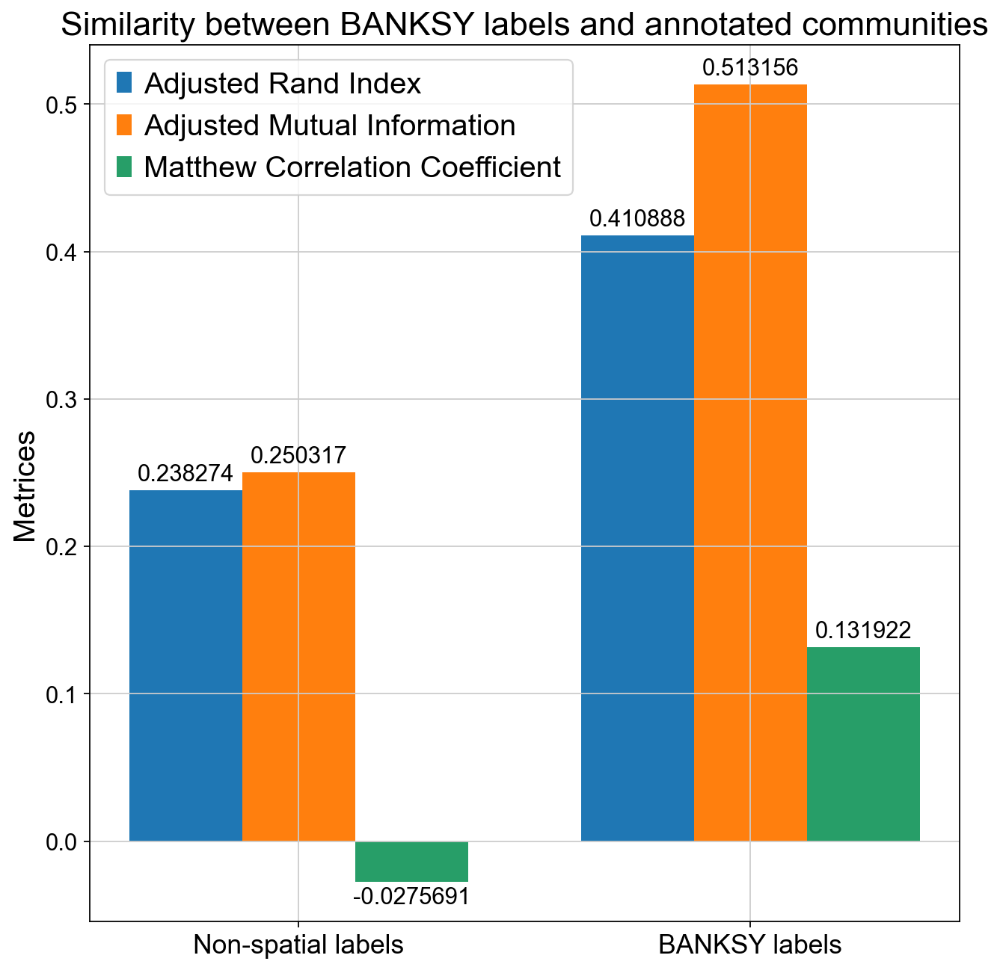

In [20]:
def bar_plot(metrics, methods):
    ''' Custom function to generate bar chart comparing metrices of labels produced by different methods'''
    fig, ax = plt.subplots(figsize=(8,8),layout='constrained')
    x = np.arange(len(methods))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0
    # method is banksy, nonspatial,
    # metric is ari, ami, mcc
    for method, metric  in metrics.items():
        offset = width * multiplier
        print(metric)
        rects = ax.bar(x + offset, metric, width, label=method)
        ax.bar_label(rects, padding=3)
        multiplier += 1

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Metrices', fontsize=18)
    ax.set_title("Similarity between BANKSY labels and annotated communities", fontsize=20)
    ax.set_xticks(x + width, methods, fontsize=16)
    ax.legend(loc='upper left', fontsize=18)
    fig.show()

### Plot the similarity between BANKSY labels and annotated communities
methods = ('Non-spatial labels', 'BANKSY labels')
metrics = {
    'Adjusted Rand Index' : (nonspatial_ari, banksy_ari),
    'Adjusted Mutual Information': (nonspatial_ami, banksy_ami),
    'Matthew Correlation Coefficient': (nonspatial_mcc,banksy_mcc ),
}
bar_plot(metrics, methods)